# Inference Velocity Correction Scale Analysis

Compare predicted (post-polyfit) velocity corrections from inference against
ground truth (post-polyfit) corrections for each velocity component (vx, vy, vz).

Both files are VENC-normalised and reconstructed from polynomial coefficients.

**Goal:** Identify any scale mismatch between predicted and ground truth corrections
that could explain why visually reasonable corrections appear to have no effect when
applied and written to DICOM.

In [3]:
import platform
from pathlib import Path

import numpy as np
import nibabel as nib
import matplotlib.pyplot as plt
import pandas as pd

from vascular_superenhancement.utils.path_config import load_path_config, _PROJECT_ROOT

config_name = "local_mac" if platform.system() == "Darwin" else "all_patients"
pc = load_path_config(config_name)

WORKING_DIR = pc.working_dir
INFERENCE_DIR = WORKING_DIR.parent / "inference"
PATIENT_DATA_DIR = WORKING_DIR / "patient_data"
REPO_ROOT = _PROJECT_ROOT

RUN_NAME = "desiring-ring_epoch-180"
COMPONENTS = ["vx", "vy", "vz"]

print(f"Repo root:     {REPO_ROOT}")
print(f"Working dir:   {WORKING_DIR}")
print(f"Inference dir: {INFERENCE_DIR}")
print(f"Run:           {RUN_NAME}")

Repo root:     /Users/yakhilesh/Files/7_PhD/vascular-superenhancement/code-base/vascular-superenhancement-4d-flow
Working dir:   /Users/yakhilesh/Files/7_PhD/vascular-superenhancement/code-base/vascular-superenhancement-4d-flow/working_dir/all_patients
Inference dir: /Users/yakhilesh/Files/7_PhD/vascular-superenhancement/code-base/vascular-superenhancement-4d-flow/working_dir/inference
Run:           desiring-ring_epoch-180


In [4]:
# Discover test patients that have inference results for this run
splits_df = pd.read_csv(
    REPO_ROOT / "splits" / "splits_01-15-26.csv"
)
test_patients = sorted(
    splits_df.loc[splits_df["split"] == "test", "patient_id"].tolist()
)

run_dir = INFERENCE_DIR / RUN_NAME
inferred_patients = sorted([d.name for d in run_dir.iterdir() if d.is_dir()])

patients = sorted(set(test_patients) & set(inferred_patients))
print(f"Test patients with inference results ({len(patients)}): {patients}")

Test patients with inference results (12): ['Balboloop', 'Biswifo', 'Bomatog', 'Boochuto', 'Boumorim', 'Bovutou', 'Cadotueg', 'Detodu', 'Diecudey', 'Diepami', 'Diequipi', 'Dithigog']


## 1. Value-range comparison across all patients

In [6]:
from tqdm import tqdm

records = []

for pid in tqdm(patients):
    pred_dir = INFERENCE_DIR / RUN_NAME / pid / "predicted_corrected_velocity"
    gt_dir = PATIENT_DATA_DIR / pid / "nifti" / "velocity_correction"

    for comp in COMPONENTS:
        pred_path = pred_dir / f"pred_correction_{comp}_{pid}.nii.gz"
        gt_path = gt_dir / f"ground_truth_correction_{comp}_{pid}.nii.gz"

        if not pred_path.exists() or not gt_path.exists():
            print(f"  MISSING: {pid} {comp}")
            continue

        pred = nib.load(pred_path).get_fdata(dtype=np.float32)
        gt = nib.load(gt_path).get_fdata(dtype=np.float32)

        records.append({
            "patient": pid,
            "component": comp,
            "pred_shape": pred.shape,
            "gt_shape": gt.shape,
            "shape_match": pred.shape == gt.shape,
            "pred_min": pred.min(),
            "pred_max": pred.max(),
            "pred_mean": pred.mean(),
            "pred_std": pred.std(),
            "gt_min": gt.min(),
            "gt_max": gt.max(),
            "gt_mean": gt.mean(),
            "gt_std": gt.std(),
            "ratio_std": pred.std() / gt.std() if gt.std() > 1e-12 else np.nan,
            "ratio_range": (pred.max() - pred.min()) / (gt.max() - gt.min())
                if (gt.max() - gt.min()) > 1e-12 else np.nan,
        })

df = pd.DataFrame(records)
print(f"Loaded {len(df)} correction pairs across {df['patient'].nunique()} patients")
df

100%|██████████| 12/12 [02:15<00:00, 11.28s/it]

Loaded 36 correction pairs across 12 patients


,patient,component,pred_shape,gt_shape,shape_match,pred_min,pred_max,pred_mean,pred_std,gt_min,gt_max,gt_mean,gt_std,ratio_std,ratio_range
0,Balboloop,vx,"(256, 178, 140)","(256, 178, 140)",True,-0.047492,0.074358,-0.000826,0.014784,-0.069462,0.054323,-0.006134,0.016521,0.894866,0.984370
1,Balboloop,vy,"(256, 178, 140)","(256, 178, 140)",True,-0.054076,0.026712,-0.006078,0.008774,-0.034504,0.067157,0.002060,0.010996,0.797979,0.794676
2,Balboloop,vz,"(256, 178, 140)","(256, 178, 140)",True,-0.077464,0.027858,-0.000691,0.013963,-0.078458,0.057271,0.001267,0.015334,0.910620,0.775975
3,Biswifo,vx,"(256, 204, 120)","(256, 204, 120)",True,-0.129612,0.062272,-0.010727,0.026043,-0.110833,0.081061,-0.020786,0.027711,0.939804,0.999948
4,Biswifo,vy,"(256, 204, 120)","(256, 204, 120)",True,-0.095249,0.119942,-0.001314,0.022295,-0.104011,0.127259,0.009651,0.025789,0.864494,0.930476
5,Biswifo,vz,"(256, 204, 120)","(256, 204, 120)",True,-0.057260,0.096674,0.009208,0.021018,-0.063056,0.104378,0.017295,0.022139,0.949382,0.919368
6,Bomatog,vx,"(256, 204, 140)","(256, 204, 140)",True,-0.074973,0.050698,-0.003813,0.018819,-0.103534,0.077278,-0.010259,0.021276,0.884513,0.695038
7,Bomatog,vy,"(256, 204, 140)","(256, 204, 140)",True,-0.067937,0.052354,-0.005748,0.013990,-0.081916,0.058667,-0.002440,0.016209,0.863112,0.855652
8,Bomatog,vz,"(256, 204, 140)","(256, 204, 140)",True,-0.043734,0.080440,0.002954,0.016423,-0.046666,0.088691,0.009106,0.016699,0.983500,0.917382
9,Boochuto,vx,"(256, 192, 120)","(256, 192, 120)",True,-0.072338,0.067036,-0.007757,0.020421,-0.106912,0.113497,-0.018511,0.028438,0.718089,0.632341


In [7]:
# Summary statistics: scale ratio between predicted and ground truth
summary = df.groupby("component").agg(
    mean_ratio_std=("ratio_std", "mean"),
    median_ratio_std=("ratio_std", "median"),
    mean_ratio_range=("ratio_range", "mean"),
    median_ratio_range=("ratio_range", "median"),
    mean_pred_std=("pred_std", "mean"),
    mean_gt_std=("gt_std", "mean"),
    shapes_match=("shape_match", "all"),
)
print("\n=== Scale ratio summary (pred / gt) ===")
print(summary.to_string())


=== Scale ratio summary (pred / gt) ===
           mean_ratio_std  median_ratio_std  mean_ratio_range  median_ratio_range  mean_pred_std  mean_gt_std  shapes_match
component                                                                                                                  
vx               0.827638          0.888160          0.789320            0.827179       0.019929     0.024126          True
vy               0.840227          0.886927          0.877831            0.902795       0.015465     0.018606          True
vz               0.849806          0.902411          0.799082            0.857586       0.017672     0.020798          True


## 2. Per-patient scatter: predicted vs ground truth (voxel-level)

/var/folders/zg/jg7gy5jn7318f47mzx158f4c0000gn/T/ipykernel_46683/3704802686.py:33: RankWarning: Polyfit may be poorly conditioned
  slope, intercept = np.polyfit(gt[valid], pred[valid], 1)
/var/folders/zg/jg7gy5jn7318f47mzx158f4c0000gn/T/ipykernel_46683/3704802686.py:33: RankWarning: Polyfit may be poorly conditioned
  slope, intercept = np.polyfit(gt[valid], pred[valid], 1)
/var/folders/zg/jg7gy5jn7318f47mzx158f4c0000gn/T/ipykernel_46683/3704802686.py:33: RankWarning: Polyfit may be poorly conditioned
  slope, intercept = np.polyfit(gt[valid], pred[valid], 1)
/var/folders/zg/jg7gy5jn7318f47mzx158f4c0000gn/T/ipykernel_46683/3704802686.py:33: RankWarning: Polyfit may be poorly conditioned
  slope, intercept = np.polyfit(gt[valid], pred[valid], 1)
/var/folders/zg/jg7gy5jn7318f47mzx158f4c0000gn/T/ipykernel_46683/3704802686.py:33: RankWarning: Polyfit may be poorly conditioned
  slope, intercept = np.polyfit(gt[valid], pred[valid], 1)
/var/folders/zg/jg7gy5jn7318f47mzx158f4c0000gn/T/ipyker

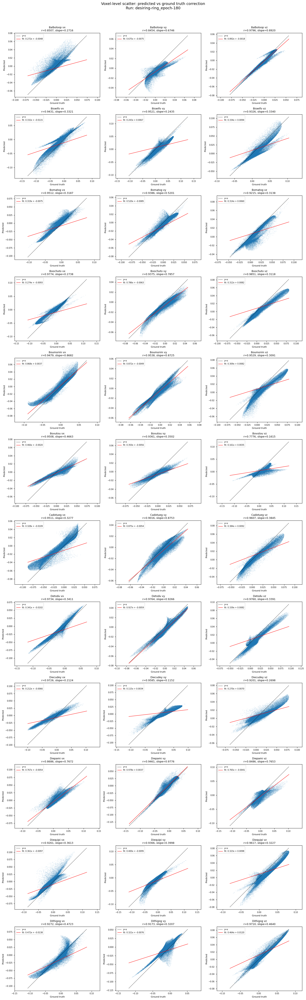

In [8]:
fig, axes = plt.subplots(len(patients), 3, figsize=(15, 4 * len(patients)),
                         squeeze=False)

for row, pid in enumerate(patients):
    pred_dir = INFERENCE_DIR / RUN_NAME / pid / "predicted_corrected_velocity"
    gt_dir = PATIENT_DATA_DIR / pid / "nifti" / "velocity_correction"

    for col, comp in enumerate(COMPONENTS):
        ax = axes[row, col]
        pred_path = pred_dir / f"pred_correction_{comp}_{pid}.nii.gz"
        gt_path = gt_dir / f"ground_truth_correction_{comp}_{pid}.nii.gz"

        if not pred_path.exists() or not gt_path.exists():
            ax.set_title(f"{pid} {comp} — MISSING")
            continue

        pred = nib.load(pred_path).get_fdata(dtype=np.float32).ravel()
        gt = nib.load(gt_path).get_fdata(dtype=np.float32).ravel()

        if pred.shape != gt.shape:
            ax.set_title(f"{pid} {comp} — shape mismatch")
            continue

        # Subsample for plotting speed
        n = len(pred)
        idx = np.random.default_rng(42).choice(n, min(50_000, n), replace=False)

        ax.scatter(gt[idx], pred[idx], s=0.3, alpha=0.15, rasterized=True)

        # Fit linear regression for slope
        valid = np.isfinite(gt) & np.isfinite(pred)
        if valid.sum() > 10:
            slope, intercept = np.polyfit(gt[valid], pred[valid], 1)
            corr = np.corrcoef(gt[valid], pred[valid])[0, 1]
            lims = [min(gt[valid].min(), pred[valid].min()),
                    max(gt[valid].max(), pred[valid].max())]
            ax.plot(lims, lims, 'k--', lw=0.8, label='y=x')
            ax.plot(lims, [slope * x + intercept for x in lims],
                    'r-', lw=1, label=f'fit: {slope:.3f}x + {intercept:.4f}')
            ax.legend(fontsize=7, loc='upper left')
            ax.set_title(f"{pid} {comp}\nr={corr:.4f}, slope={slope:.4f}", fontsize=9)
        else:
            ax.set_title(f"{pid} {comp}", fontsize=9)

        ax.set_xlabel("Ground truth", fontsize=8)
        ax.set_ylabel("Predicted", fontsize=8)
        ax.set_aspect('equal', adjustable='datalim')
        ax.tick_params(labelsize=7)

fig.suptitle(f"Voxel-level scatter: predicted vs ground truth correction\n"
             f"Run: {RUN_NAME}", fontsize=13, y=1.01)
fig.tight_layout()
plt.show()

## 3. Spatial comparison: mid-slice visualisation

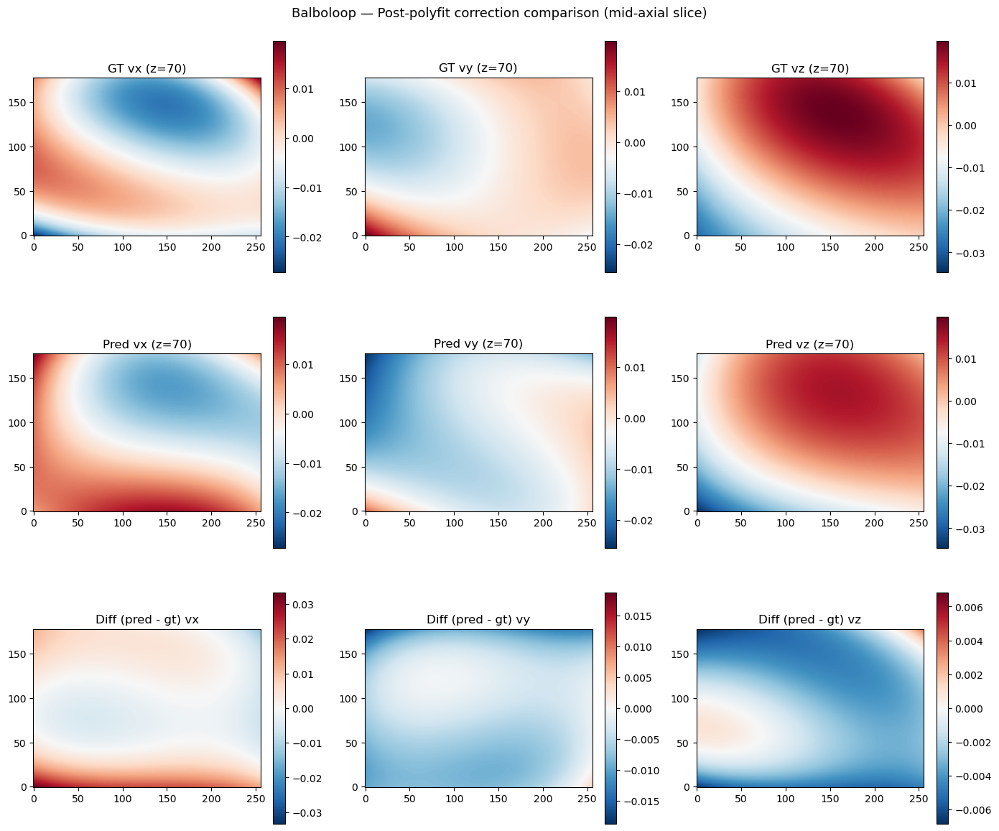

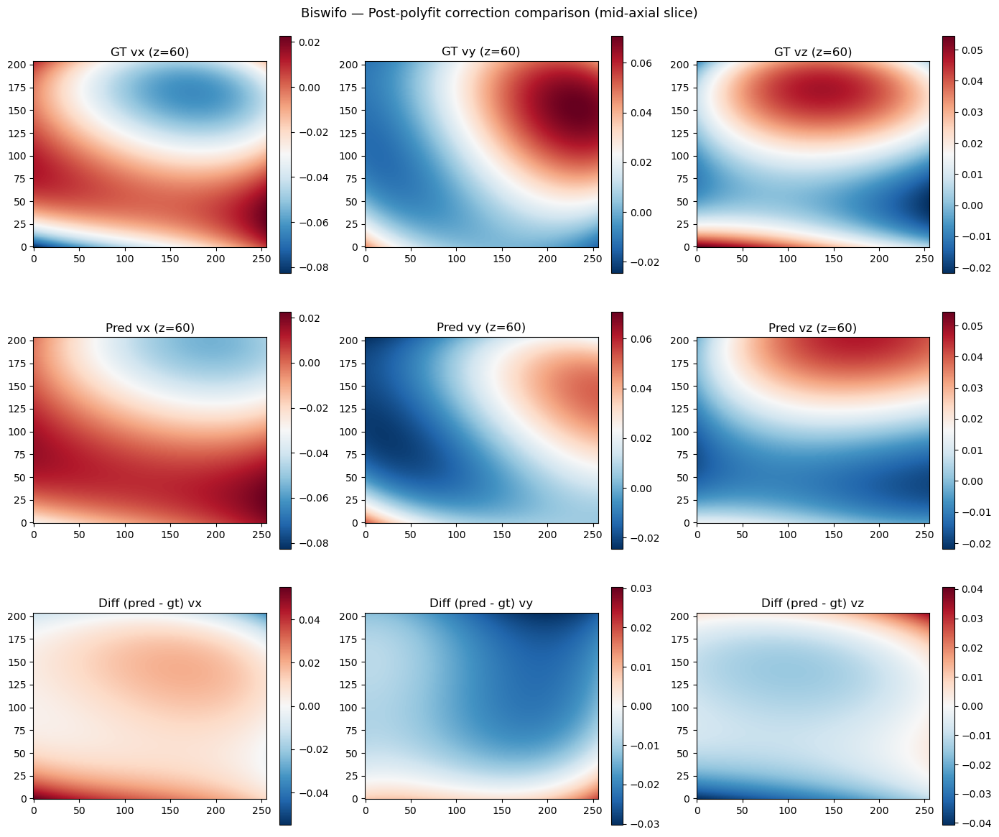

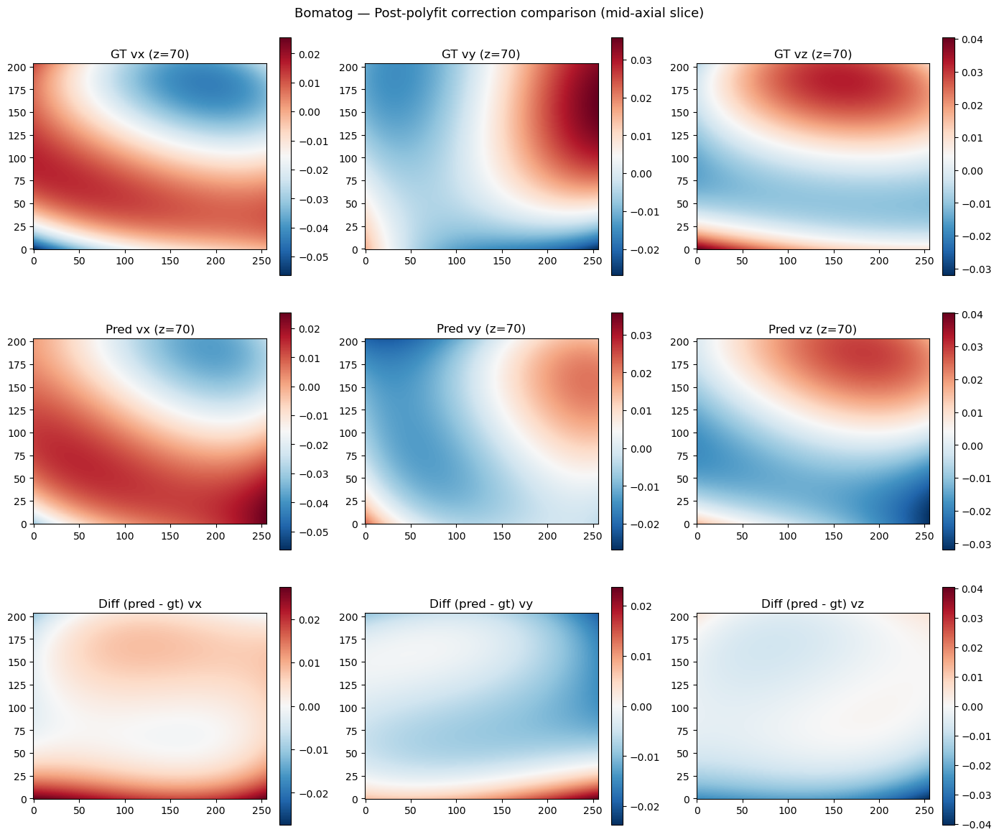

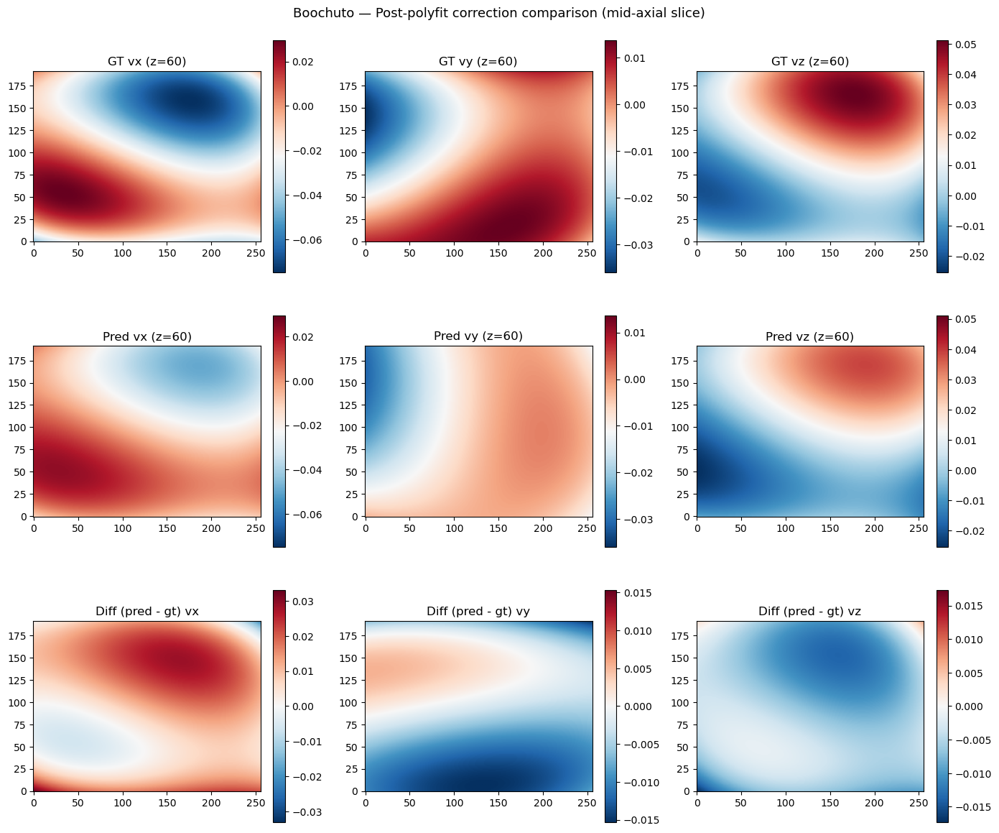

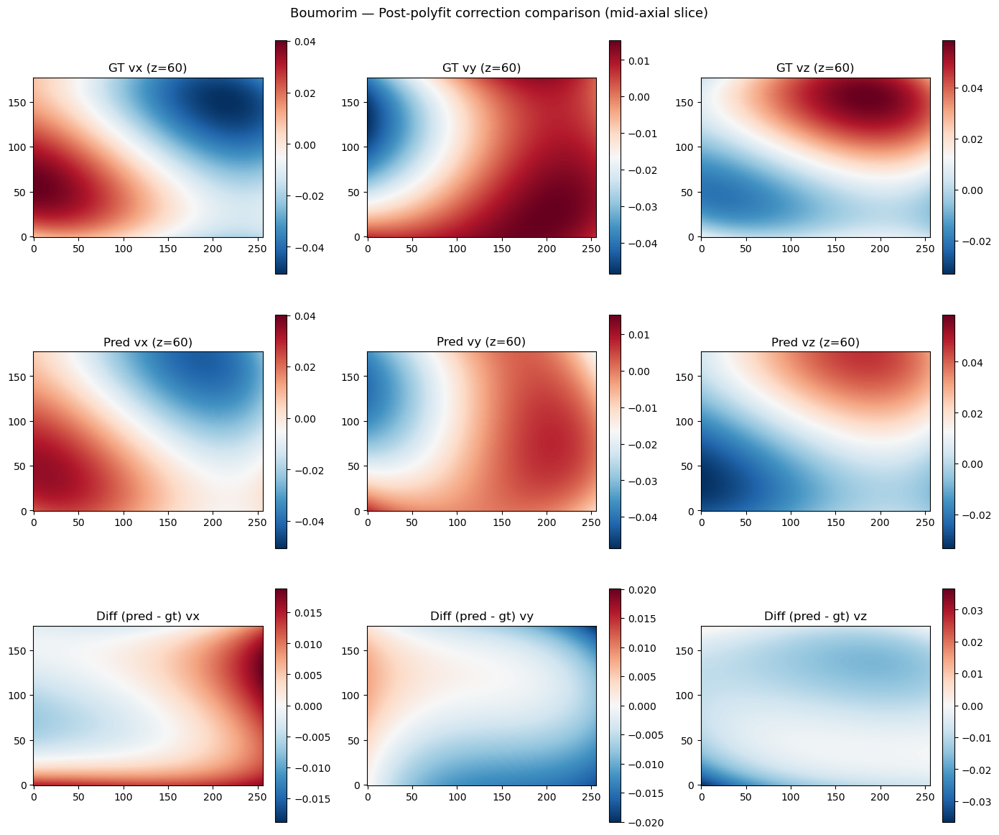

...

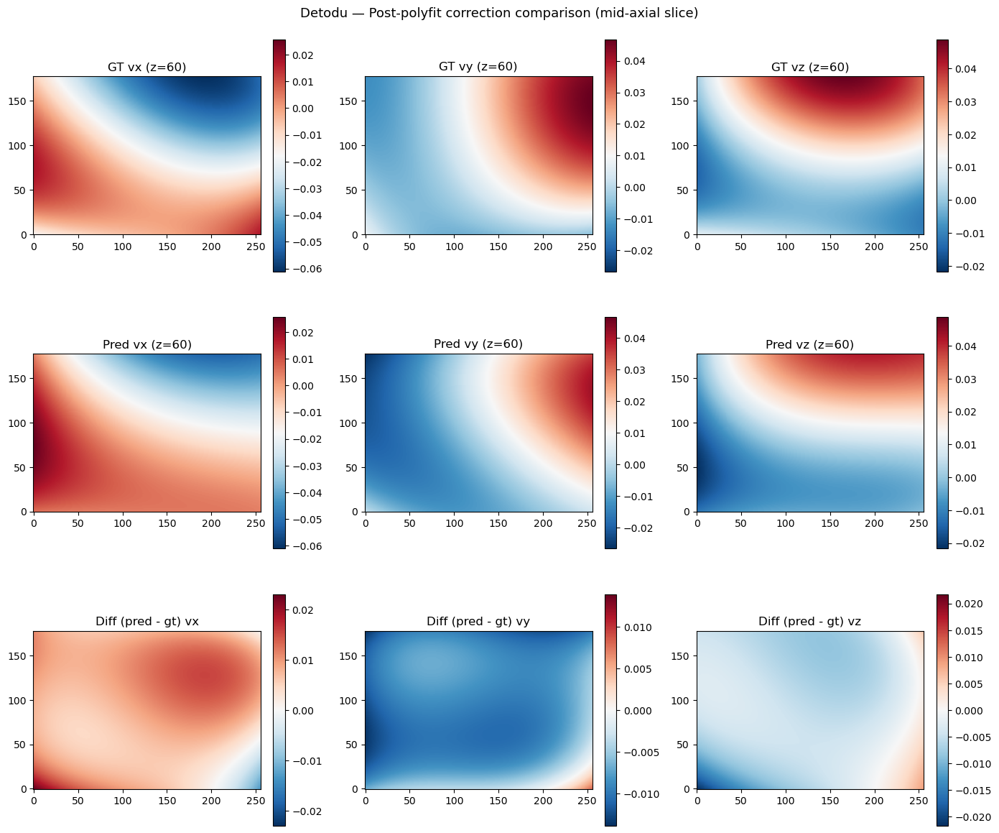

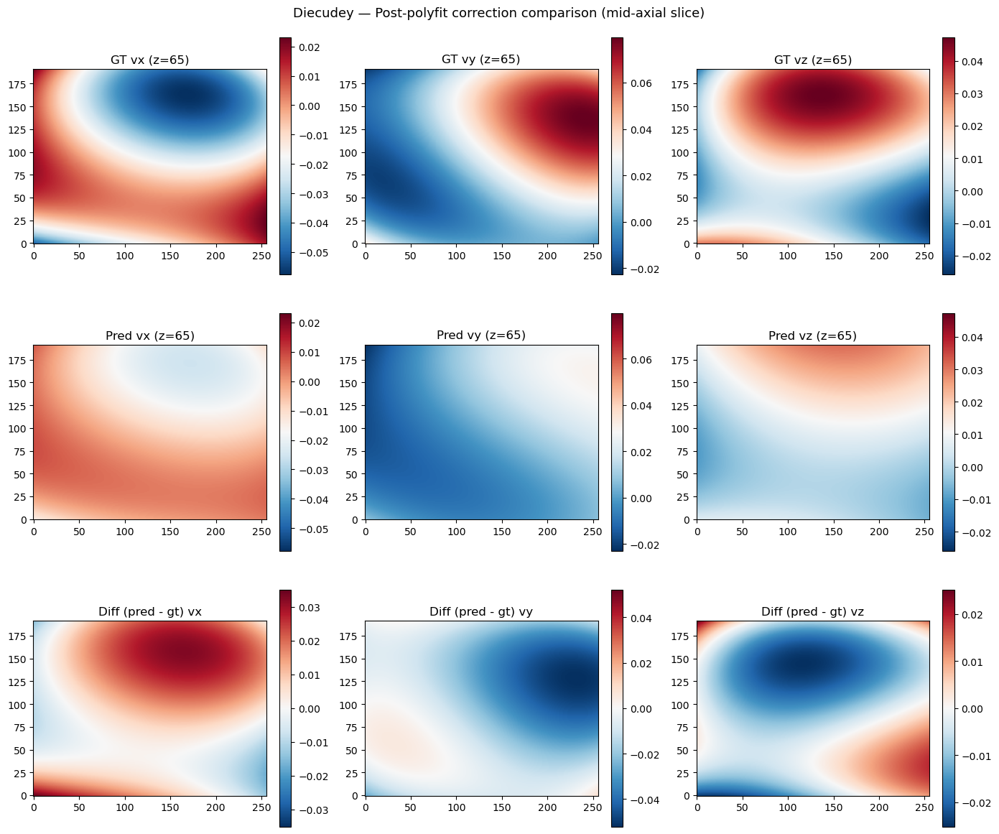

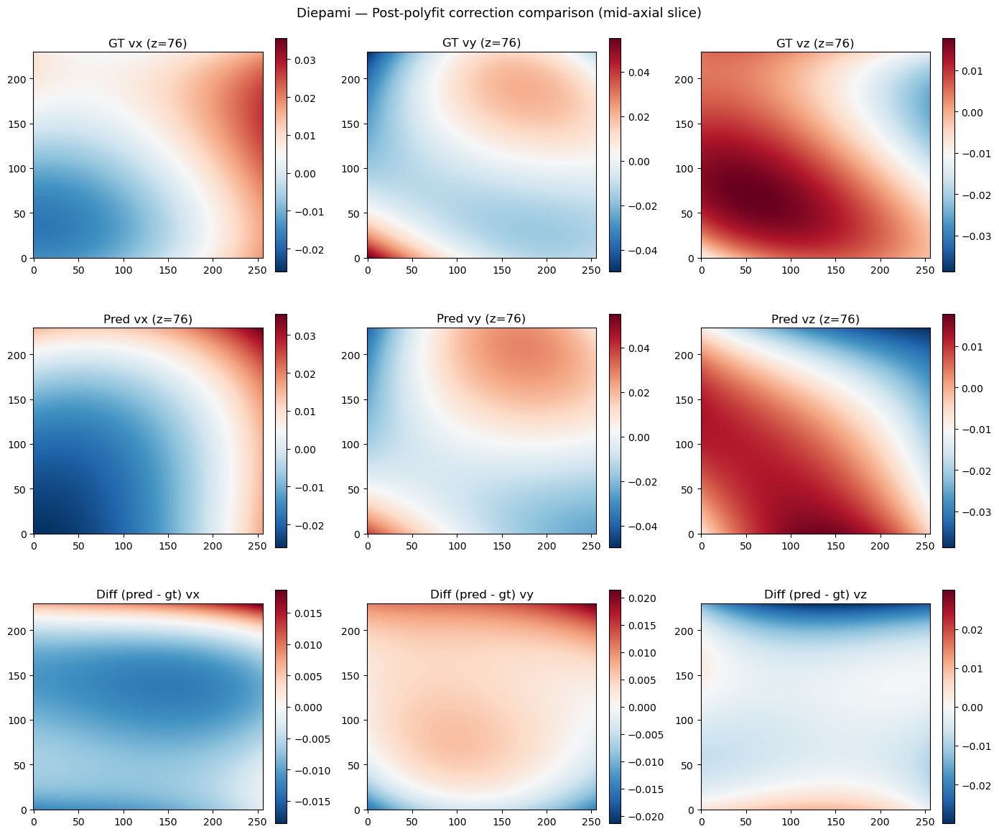

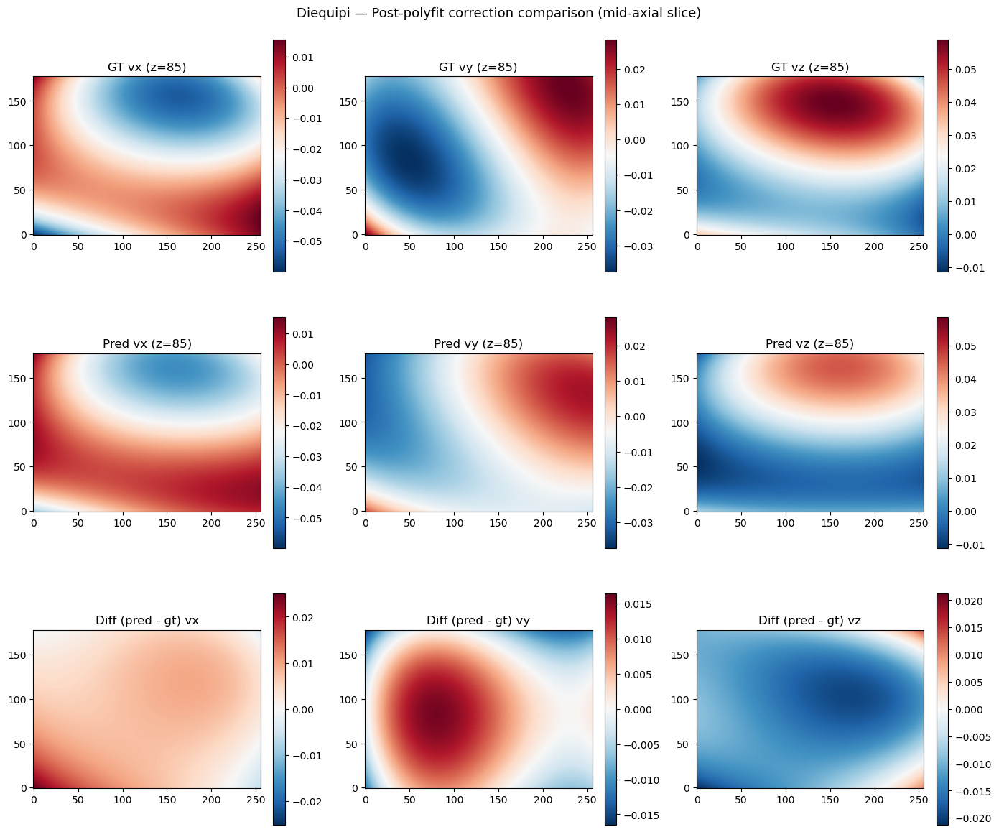

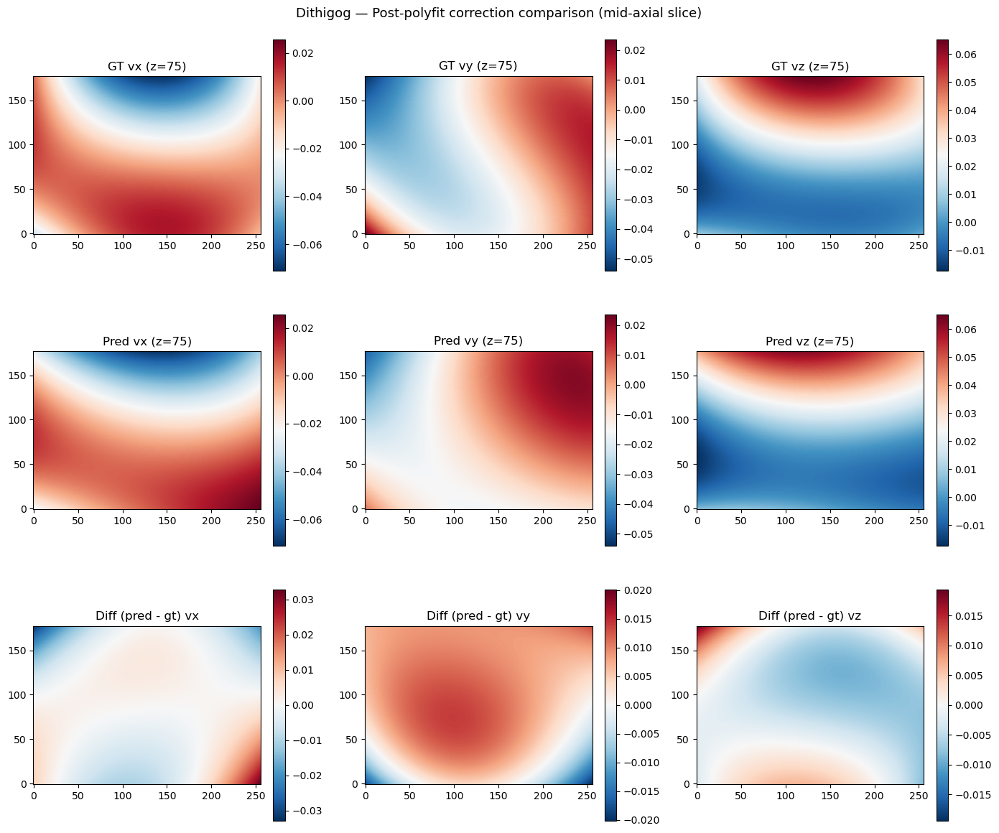

In [9]:
for pid in patients:
    pred_dir = INFERENCE_DIR / RUN_NAME / pid / "predicted_corrected_velocity"
    gt_dir = PATIENT_DATA_DIR / pid / "nifti" / "velocity_correction"

    fig, axes = plt.subplots(3, 3, figsize=(14, 12))

    for col, comp in enumerate(COMPONENTS):
        pred_path = pred_dir / f"pred_correction_{comp}_{pid}.nii.gz"
        gt_path = gt_dir / f"ground_truth_correction_{comp}_{pid}.nii.gz"

        if not pred_path.exists() or not gt_path.exists():
            for r in range(3):
                axes[r, col].set_title(f"{comp} — MISSING")
            continue

        pred = nib.load(pred_path).get_fdata(dtype=np.float32)
        gt = nib.load(gt_path).get_fdata(dtype=np.float32)

        mid_z = pred.shape[2] // 2

        vmin = min(gt[:, :, mid_z].min(), pred[:, :, mid_z].min())
        vmax = max(gt[:, :, mid_z].max(), pred[:, :, mid_z].max())

        im0 = axes[0, col].imshow(gt[:, :, mid_z].T, origin='lower',
                                   cmap='RdBu_r', vmin=vmin, vmax=vmax)
        axes[0, col].set_title(f"GT {comp} (z={mid_z})")
        plt.colorbar(im0, ax=axes[0, col], fraction=0.046)

        im1 = axes[1, col].imshow(pred[:, :, mid_z].T, origin='lower',
                                   cmap='RdBu_r', vmin=vmin, vmax=vmax)
        axes[1, col].set_title(f"Pred {comp} (z={mid_z})")
        plt.colorbar(im1, ax=axes[1, col], fraction=0.046)

        diff = pred[:, :, mid_z] - gt[:, :, mid_z]
        abs_max = max(abs(diff.min()), abs(diff.max()), 1e-12)
        im2 = axes[2, col].imshow(diff.T, origin='lower',
                                   cmap='RdBu_r', vmin=-abs_max, vmax=abs_max)
        axes[2, col].set_title(f"Diff (pred - gt) {comp}")
        plt.colorbar(im2, ax=axes[2, col], fraction=0.046)

    fig.suptitle(f"{pid} — Post-polyfit correction comparison (mid-axial slice)",
                 fontsize=13)
    fig.tight_layout()
    plt.show()

## 4. Polynomial coefficient comparison

In [10]:
coeff_records = []

for pid in patients:
    pred_coeff_path = (
        INFERENCE_DIR / RUN_NAME / pid
        / "predicted_corrected_velocity" / f"pred_poly_coefficients_{pid}.npz"
    )
    gt_coeff_path = (
        PATIENT_DATA_DIR / pid / "nifti" / "velocity_correction"
        / f"poly_coefficients_{pid}.npz"
    )

    if not pred_coeff_path.exists() or not gt_coeff_path.exists():
        print(f"  Coefficients MISSING for {pid}")
        continue

    pred_data = np.load(pred_coeff_path)
    gt_data = np.load(gt_coeff_path)

    pred_c = pred_data["coefficients"]  # (n_coeffs, 3)
    gt_c = gt_data["coefficients"]      # (n_coeffs, 3)

    pred_venc = float(pred_data["venc"]) if "venc" in pred_data else None
    gt_venc = float(gt_data["venc"]) if "venc" in gt_data else None

    pred_shape = tuple(pred_data["downsampled_shape"]) if "downsampled_shape" in pred_data else None
    gt_shape = tuple(gt_data["original_shape"]) if "original_shape" in gt_data else None

    for i, comp in enumerate(COMPONENTS):
        coeff_records.append({
            "patient": pid,
            "component": comp,
            "pred_venc": pred_venc,
            "gt_venc": gt_venc,
            "venc_match": pred_venc == gt_venc if (pred_venc and gt_venc) else None,
            "pred_coeff_shape": pred_c.shape,
            "gt_coeff_shape": gt_c.shape,
            "pred_recon_shape": pred_shape,
            "gt_recon_shape": gt_shape,
            "pred_coeff_norm": np.linalg.norm(pred_c[:, i]),
            "gt_coeff_norm": np.linalg.norm(gt_c[:, i]),
            "coeff_norm_ratio": np.linalg.norm(pred_c[:, i]) / np.linalg.norm(gt_c[:, i])
                if np.linalg.norm(gt_c[:, i]) > 1e-12 else np.nan,
            "coeff_cosine_sim": float(
                np.dot(pred_c[:, i], gt_c[:, i])
                / (np.linalg.norm(pred_c[:, i]) * np.linalg.norm(gt_c[:, i]) + 1e-12)
            ),
        })

coeff_df = pd.DataFrame(coeff_records)
print("=== Polynomial coefficient comparison ===")
coeff_df

=== Polynomial coefficient comparison ===


,patient,component,pred_venc,gt_venc,venc_match,pred_coeff_shape,gt_coeff_shape,pred_recon_shape,gt_recon_shape,pred_coeff_norm,gt_coeff_norm,coeff_norm_ratio,coeff_cosine_sim
0,Balboloop,vx,3499.0,3499.0,True,"(20, 3)","(20, 3)","(128, 128, 64)","(256, 178, 140)",0.051233,0.063602,0.805524,0.826611
1,Balboloop,vy,3499.0,3499.0,True,"(20, 3)","(20, 3)","(128, 128, 64)","(256, 178, 140)",0.030195,0.044569,0.677488,0.746435
2,Balboloop,vz,3499.0,3499.0,True,"(20, 3)","(20, 3)","(128, 128, 64)","(256, 178, 140)",0.049950,0.062705,0.796594,0.979997
3,Biswifo,vx,2500.0,2500.0,True,"(20, 3)","(20, 3)","(128, 128, 64)","(256, 204, 120)",0.087852,0.128529,0.683518,0.934949
4,Biswifo,vy,2500.0,2500.0,True,"(20, 3)","(20, 3)","(128, 128, 64)","(256, 204, 120)",0.104201,0.117907,0.883752,0.953569
5,Biswifo,vz,2500.0,2500.0,True,"(20, 3)","(20, 3)","(128, 128, 64)","(256, 204, 120)",0.079182,0.108515,0.729690,0.954242
6,Bomatog,vx,3499.0,3499.0,True,"(20, 3)","(20, 3)","(128, 128, 64)","(256, 204, 140)",0.072016,0.092844,0.775666,0.959815
7,Bomatog,vy,3499.0,3499.0,True,"(20, 3)","(20, 3)","(128, 128, 64)","(256, 204, 140)",0.055294,0.060912,0.907760,0.872706
8,Bomatog,vz,3499.0,3499.0,True,"(20, 3)","(20, 3)","(128, 128, 64)","(256, 204, 140)",0.067427,0.078264,0.861534,0.932695
9,Boochuto,vx,2500.0,2500.0,True,"(20, 3)","(20, 3)","(128, 128, 64)","(256, 192, 120)",0.093233,0.152155,0.612752,0.981443


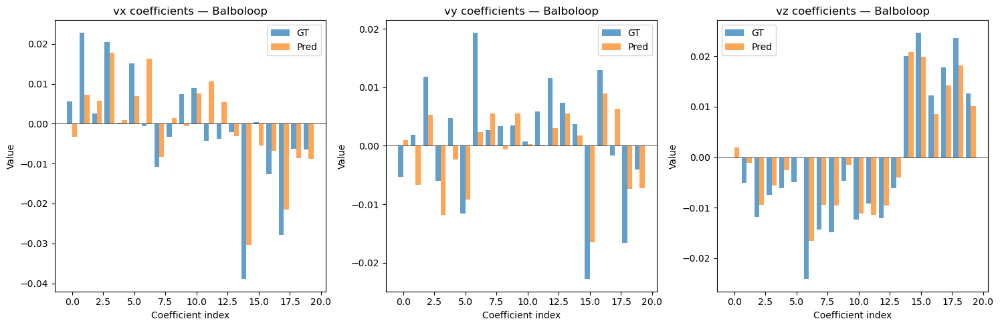


VENC — pred: 3499.0, gt: 3499.0
Reconstruction shape — pred: [128 128  64], gt: [256 178 140]


In [11]:
# Per-coefficient visual comparison for a sample patient
SAMPLE_PID = patients[0]

pred_data = np.load(
    INFERENCE_DIR / RUN_NAME / SAMPLE_PID
    / "predicted_corrected_velocity" / f"pred_poly_coefficients_{SAMPLE_PID}.npz"
)
gt_data = np.load(
    PATIENT_DATA_DIR / SAMPLE_PID / "nifti" / "velocity_correction"
    / f"poly_coefficients_{SAMPLE_PID}.npz"
)

pred_c = pred_data["coefficients"]
gt_c = gt_data["coefficients"]

fig, axes = plt.subplots(1, 3, figsize=(15, 5))
for i, comp in enumerate(COMPONENTS):
    ax = axes[i]
    n = pred_c.shape[0]
    x = np.arange(n)
    ax.bar(x - 0.2, gt_c[:, i], width=0.4, label="GT", alpha=0.7)
    ax.bar(x + 0.2, pred_c[:, i], width=0.4, label="Pred", alpha=0.7)
    ax.set_xlabel("Coefficient index")
    ax.set_ylabel("Value")
    ax.set_title(f"{comp} coefficients — {SAMPLE_PID}")
    ax.legend()
    ax.axhline(0, color='k', lw=0.5)

fig.tight_layout()
plt.show()

print(f"\nVENC — pred: {pred_data.get('venc')}, gt: {gt_data.get('venc')}")
print(f"Reconstruction shape — pred: {pred_data.get('downsampled_shape')}, "
      f"gt: {gt_data.get('original_shape')}")

## 5. Histogram comparison

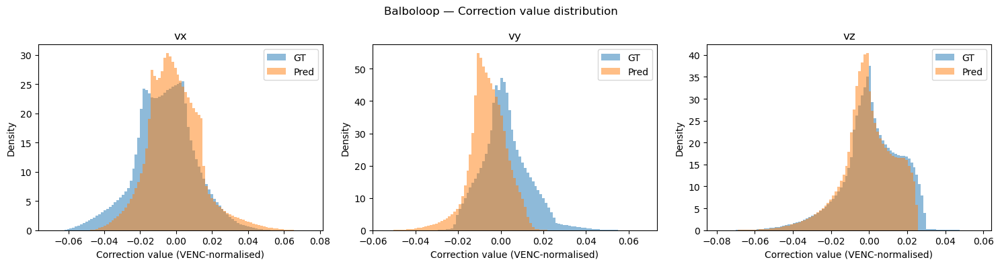

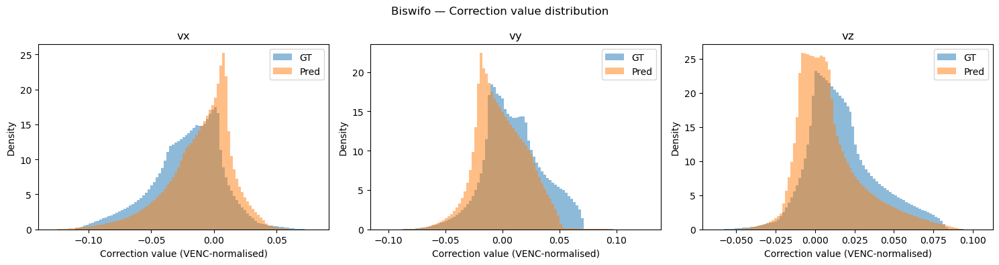

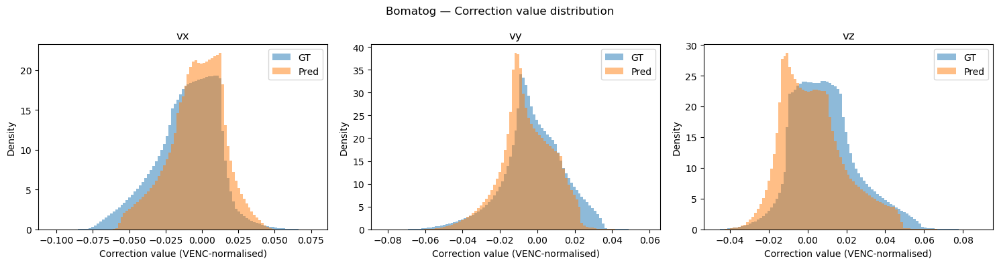

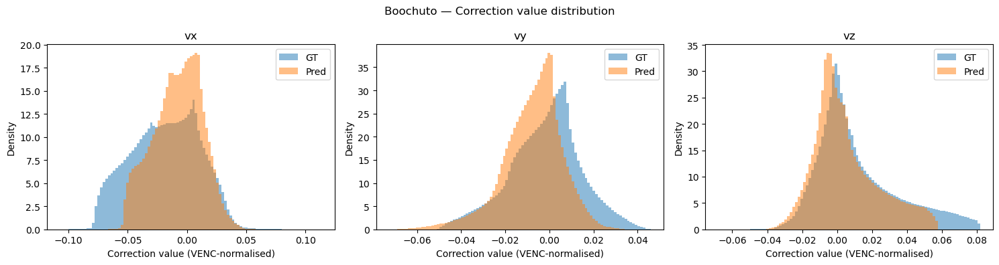

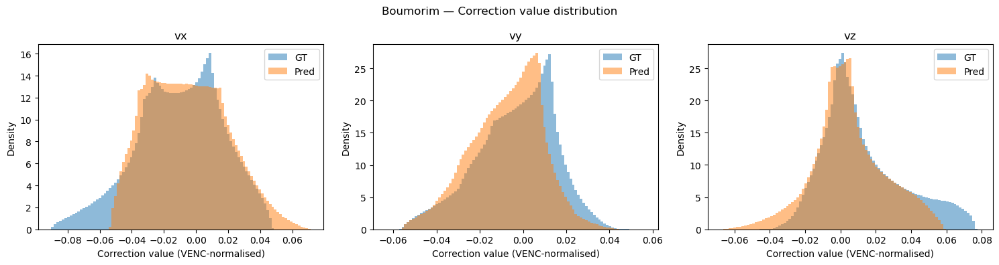

...

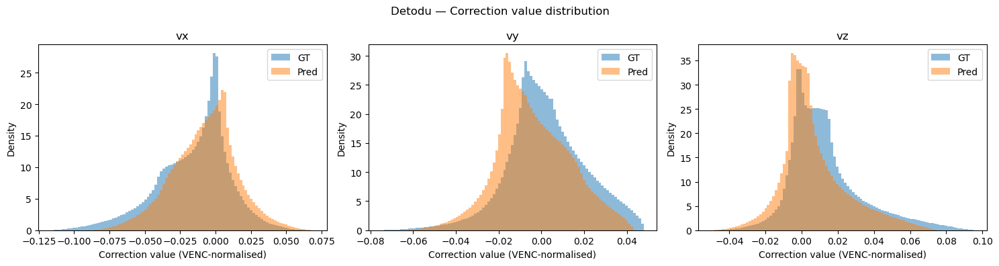

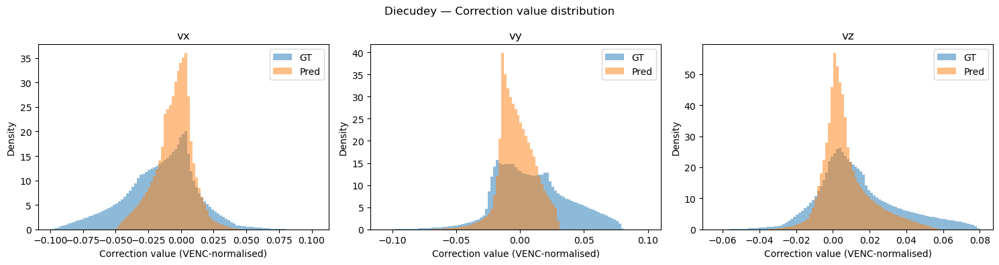

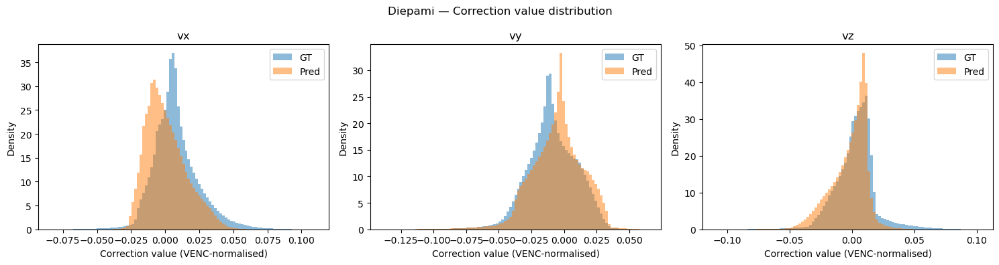

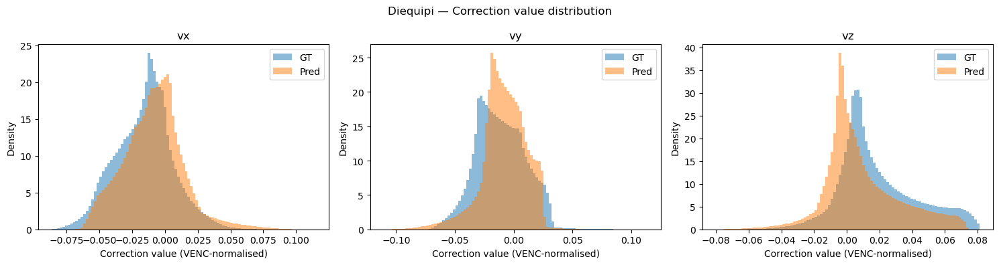

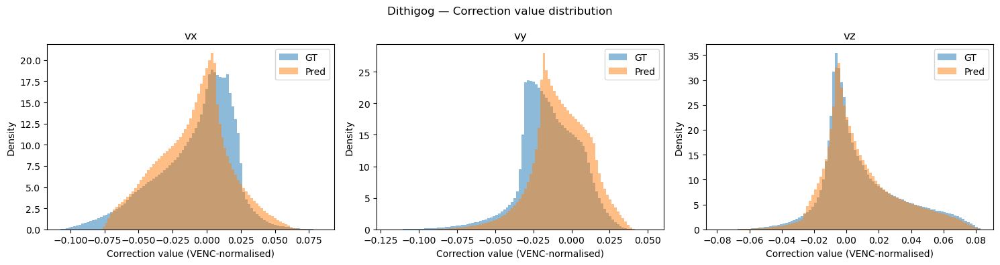

In [12]:
for pid in patients:
    pred_dir = INFERENCE_DIR / RUN_NAME / pid / "predicted_corrected_velocity"
    gt_dir = PATIENT_DATA_DIR / pid / "nifti" / "velocity_correction"

    fig, axes = plt.subplots(1, 3, figsize=(15, 4))

    for col, comp in enumerate(COMPONENTS):
        pred_path = pred_dir / f"pred_correction_{comp}_{pid}.nii.gz"
        gt_path = gt_dir / f"ground_truth_correction_{comp}_{pid}.nii.gz"

        if not pred_path.exists() or not gt_path.exists():
            axes[col].set_title(f"{comp} — MISSING")
            continue

        pred = nib.load(pred_path).get_fdata(dtype=np.float32).ravel()
        gt = nib.load(gt_path).get_fdata(dtype=np.float32).ravel()

        all_vals = np.concatenate([pred, gt])
        bins = np.linspace(all_vals.min(), all_vals.max(), 100)

        axes[col].hist(gt, bins=bins, alpha=0.5, label="GT", density=True)
        axes[col].hist(pred, bins=bins, alpha=0.5, label="Pred", density=True)
        axes[col].set_title(f"{comp}")
        axes[col].legend()
        axes[col].set_xlabel("Correction value (VENC-normalised)")
        axes[col].set_ylabel("Density")

    fig.suptitle(f"{pid} — Correction value distribution", fontsize=12)
    fig.tight_layout()
    plt.show()

## 6. Aggregate diagnostics

In [13]:
print("=" * 70)
print("DIAGNOSTIC SUMMARY")
print("=" * 70)

# Check shape mismatches
mismatched = df[~df["shape_match"]]
if len(mismatched) > 0:
    print(f"\n*** SHAPE MISMATCHES ({len(mismatched)}): ***")
    print(mismatched[["patient", "component", "pred_shape", "gt_shape"]])
else:
    print("\nAll shapes match between predicted and ground truth.")

# Scale ratios
print(f"\n--- Scale ratio (pred_std / gt_std) ---")
for comp in COMPONENTS:
    subset = df[df["component"] == comp]
    r = subset["ratio_std"]
    print(f"  {comp}: mean={r.mean():.4f}, median={r.median():.4f}, "
          f"min={r.min():.4f}, max={r.max():.4f}")

print(f"\n--- Scale ratio (pred_range / gt_range) ---")
for comp in COMPONENTS:
    subset = df[df["component"] == comp]
    r = subset["ratio_range"]
    print(f"  {comp}: mean={r.mean():.4f}, median={r.median():.4f}, "
          f"min={r.min():.4f}, max={r.max():.4f}")

# VENC consistency
if len(coeff_df) > 0:
    venc_issues = coeff_df[coeff_df["venc_match"] == False]
    if len(venc_issues) > 0:
        print(f"\n*** VENC MISMATCHES ({len(venc_issues)}): ***")
        print(venc_issues[["patient", "pred_venc", "gt_venc"]])
    else:
        print(f"\nVENC values consistent across all patients.")

    # Coefficient norm ratios
    print(f"\n--- Coefficient norm ratio (pred / gt) ---")
    for comp in COMPONENTS:
        subset = coeff_df[coeff_df["component"] == comp]
        r = subset["coeff_norm_ratio"]
        print(f"  {comp}: mean={r.mean():.4f}, median={r.median():.4f}")

    print(f"\n--- Coefficient cosine similarity ---")
    for comp in COMPONENTS:
        subset = coeff_df[coeff_df["component"] == comp]
        r = subset["coeff_cosine_sim"]
        print(f"  {comp}: mean={r.mean():.4f}, median={r.median():.4f}")

# Reconstruction shape mismatch (pred uses downsampled, gt uses original)
if len(coeff_df) > 0:
    shape_info = coeff_df[["patient", "pred_recon_shape", "gt_recon_shape"]].drop_duplicates(subset="patient")
    print(f"\n--- Coefficient reconstruction shapes ---")
    print("(pred saved 'downsampled_shape', gt saved 'original_shape')")
    for _, row in shape_info.iterrows():
        match = "MATCH" if row["pred_recon_shape"] == row["gt_recon_shape"] else "DIFFER"
        print(f"  {row['patient']}: pred={row['pred_recon_shape']}, gt={row['gt_recon_shape']} [{match}]")

DIAGNOSTIC SUMMARY

All shapes match between predicted and ground truth.

--- Scale ratio (pred_std / gt_std) ---
  vx: mean=0.8276, median=0.8882, min=0.4905, max=1.0427
  vy: mean=0.8402, median=0.8869, min=0.4877, max=1.0333
  vz: mean=0.8498, median=0.9024, min=0.5009, max=0.9835

--- Scale ratio (pred_range / gt_range) ---
  vx: mean=0.7893, median=0.8272, min=0.4792, max=1.1610
  vy: mean=0.8778, median=0.9028, min=0.5333, max=1.1161
  vz: mean=0.7991, median=0.8576, min=0.3195, max=0.9551

VENC values consistent across all patients.

--- Coefficient norm ratio (pred / gt) ---
  vx: mean=0.7308, median=0.7906
  vy: mean=0.8069, median=0.8842
  vz: mean=0.7482, median=0.7848

--- Coefficient cosine similarity ---
  vx: mean=0.9151, median=0.9247
  vy: mean=0.8863, median=0.9008
  vz: mean=0.9336, median=0.9441

--- Coefficient reconstruction shapes ---
(pred saved 'downsampled_shape', gt saved 'original_shape')
  Balboloop: pred=(np.int64(128), np.int64(128), np.int64(64)), gt=(np